# Green Cover Time Series Smoothing
Looking at Seasonal Cover and Persistent Green

In [1]:
#Python 3
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import xarray as xr
import pickle, gzip
import folium

# Utility Query Mapping function
def mapQuery(query):
    map_hybrid = folium.Map(
        location=[np.mean(query['lat']), np.mean(query['lon'])],
        zoom_start=14, 
        tiles=" http://mt1.google.com/vt/lyrs=y&z={z}&x={x}&y={y}",
        attr="Google")
    map_hybrid.add_children(folium.features.PolyLine(
        locations=[
          (query['lat'][0],query['lon'][0]),
          (query['lat'][0],query['lon'][1]),
          (query['lat'][1],query['lon'][1]),
          (query['lat'][1],query['lon'][0]),
          (query['lat'][0],query['lon'][0])],
        color='red', opacity=0.5))
    map_hybrid.add_children(folium.features.LatLngPopup())
    return map_hybrid


### Prepackaged time series extracts from the cube
We use these for testing without having to pull them in again  
The Mitchell Grass Downs dataset is big (on disk and in memory)

In [2]:
# Run if needing to restart
with gzip.open('data/fcDrillMang.sav', 'rb') as f:
    fcDrillMang = pickle.load(f).resample('3M', dim='time', how='median', keep_attrs=True)
with gzip.open('data/fcDrillMBay.sav', 'rb') as f:
    fcDrillMBay = pickle.load(f).resample('3M', dim='time', how='median', keep_attrs=True)
with gzip.open('data/fcDrillMGD.sav', 'rb') as f:
    fcDrillMGD = pickle.load(f).resample('3M', dim='time', how='median', keep_attrs=True)
with gzip.open('data/fcDrillPine.sav', 'rb') as f:
    fcDrillPine = pickle.load(f).resample('3M', dim='time', how='median', keep_attrs=True)


### The form of the gaussian weighting of the residuals used in the smoothing function

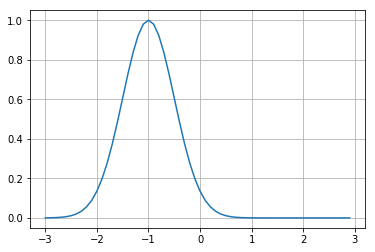

In [3]:
plt.plot(np.arange(-3,3,0.1),np.exp(-0.5*((np.arange(-3,3,0.1)--1.0)/0.5)**2))
plt.grid()

## The smooothing spline function
The defaults seem to be OK for most applications

In [3]:
from scipy.interpolate import UnivariateSpline
    
def edgeSmoothSpline(fitData, fitTime, smoothing=None, iterations=5, degree=3, weightsCentre = -1.0, weightsStdev = 0.5):

    '''
    Function to fit a spline to the top or bottom of a time series.
    Uses a weighted univariate spline, where the weights are calculated
    iteratively based on the number of standard deviations of the residuals.

    Use:
    edgeSmoothSpline(fitData, fitTime, smoothing=None, iterations=5, degree=3, weightsCentre = -1.0, weightsStdev = 0.5)

    Inputs:
    fitData: a n x 1 array of data with nan indicating nodata
    fitTime: a n x 1 array of datetimes

    Keyword parameters:
    smoothing: Positive smoothing factor used to choose the number of knots.
      Controls the smoothness of the spline. Defaults to n x degree x degree.
    degree: Degree of the smoothing spline.  Must be int <= 5. The default is 3.
    iterations: The number of times the spline is reweighted. Default is 5.
        Should iterate to a stable fit given sensible parameters
    weightsCentre: The number of standard deviations from the mean of the residuals
         where the spline is weighted the most. Defaults to -1.0.
        To fit the base of the line, use a negative value for weightsCentre.
        The default -1 standard deviation weights residuals between 0 and -2
        standard deviations from the mean the highest, and positive deviations 
        or points more than 3 standard deviations from the mean with ~zero weight.
    weightsStdev: Controls the width of the gaussian centred on weightsCentre
        and hence the rejection of outliers. Defaults to 0.5. 
        You can plot the weighting gaussian using:
        plt.plot(np.arange(-3,3,0.1),np.exp(-0.5*((np.arange(-3,3,0.1)-weightsCentre)/weightsStdev)**2))

    Peter Scarth 2017-04-15
    '''

    # Remove NoData values
    goodIDX = np.isfinite(fitData).nonzero()

    # Return nan if too many nodata values
    if len(goodIDX[0]) < degree+1:
        return np.nan * np.ones_like(fitData)

    # Subset the input to real data
    fitData = fitData[goodIDX]

    # Set the smoothing to be related to the number of valid data points
    if smoothing==None:
        smoothing=len(fitData) * degree * degree

    # Convert time to scaled floats.
    fitTime = ((fitTime-np.min(fitTime))/(np.max(fitTime)-np.min(fitTime))).astype('float64')

    # Initialise the fitting weights
    fitWeights = np.ones_like(fitData)

    # Loop for the number of iterations
    for i in range(iterations):
        # Fit the Weighted Spline to the valid data
        spl = UnivariateSpline(fitTime[goodIDX],fitData,w=fitWeights,k=degree,s=smoothing)
        # Calculate the residuals from the fit
        residuals = (spl(fitTime[goodIDX]) - fitData)
        # Calculate the normalised residuals
        residualsDist = (residuals - residuals.mean())/(residuals.std())
        # Adjust the fitting weights using the residuals as input to a gaussian centred over weightsCentre
        fitWeights =  np.exp(-0.5*((residualsDist + weightsCentre) / weightsStdev)**2.0)

    # Calculate the fitted dataset for all the time periods
    return spl(fitTime)





### Test the smoothing on our data

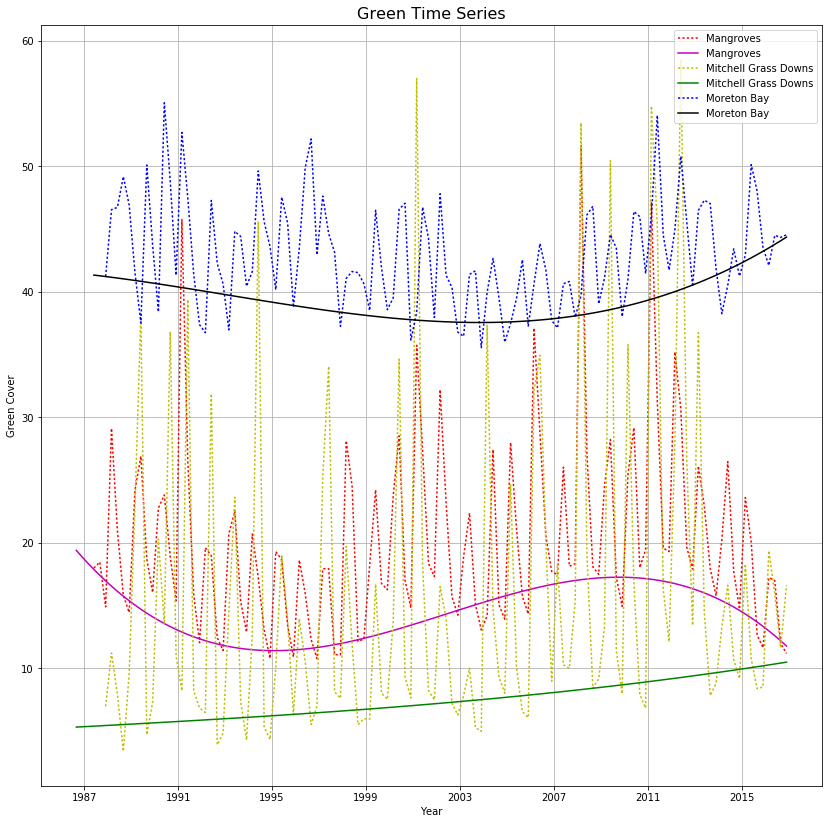

In [4]:
# We define a helper function for the plotting
def testSmooth(drillData):
    spatial_mean = drillData.mean(dim=('x', 'y'))
    pvData=spatial_mean.PV.data
    pvTime=spatial_mean.PV.time
    pvFit=edgeSmoothSpline(pvData,pvTime)
    return pvData, pvTime, pvFit
  
# Plot up the spatial means
fig = plt.figure(figsize=(14,14))
# Mangroves FNQ
pvData, pvTime, pvFit = testSmooth(fcDrillMang)
plt.plot(pvTime,pvData, 'r:',pvTime,pvFit, 'm-', label='Mangroves')
# Mitchell Grass Downs means
pvData, pvTime, pvFit = testSmooth(fcDrillMGD)
plt.plot(pvTime,pvData, 'y:',pvTime,pvFit, 'g-', label='Mitchell Grass Downs')
# Moreton Bay Island means
pvData, pvTime, pvFit = testSmooth(fcDrillMBay)
plt.plot(pvTime,pvData, 'b:',pvTime,pvFit, 'k-', label='Moreton Bay')
# Labels
plt.xlabel('Year')
plt.ylabel('Green Cover')
plt.title('Green Time Series', fontsize=16)
plt.legend()
plt.grid(True)


### Apply to pine plantation data
Note it's a little noisy, particulary at the endpoints

In [6]:
pinequery = {
    'time': ('1980-01-01', '2017-01-01'),
     'lat': (-25.69405,-25.70478),
     'lon': (152.82414,152.84121),
        }
mapQuery(pinequery)


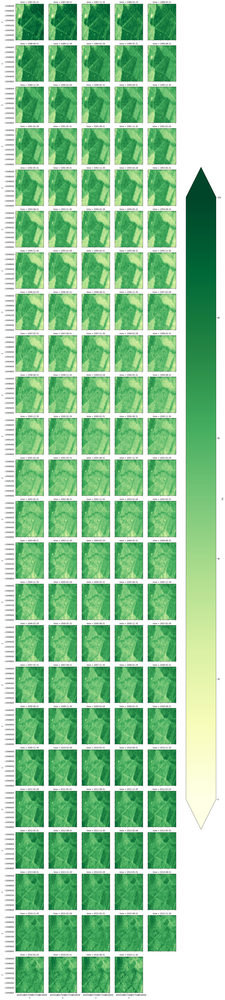

In [7]:
fcDrillPine['PG']=(('time', 'y', 'x'),np.apply_along_axis(edgeSmoothSpline,0,fcDrillPine.PV.data,fcDrillPine.PV.time))
aspect=fcDrillPine.PG.shape[2]/fcDrillPine.PG.shape[1]
fcDrillPine.PG.plot.imshow(col='time', col_wrap=5, cmap='YlGn',vmin=0, vmax=100, aspect=aspect)


### Apply to FNQ Mangroves

In [8]:
mangrovequery = {
    'time': ('1980-01-01', '2017-01-01'),
     'lat': (-17.05936,-17.07792),
     'lon': (140.94218,140.97370),
}
mapQuery(mangrovequery)

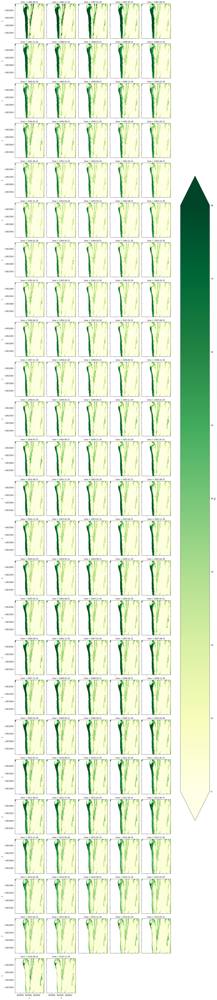

In [9]:
fcDrillMang['PG']=(('time', 'y', 'x'),np.apply_along_axis(edgeSmoothSpline,0,fcDrillMang.PV.data,fcDrillMang.PV.time))
aspect=fcDrillMang.PG.shape[2]/fcDrillMang.PG.shape[1]
fcDrillMang.PG.plot.imshow(col='time', col_wrap=5, cmap='YlGn',vmin=0, vmax=80,aspect=aspect)


### Apply to Moreton Bay Islands

In [10]:
mbquery = {
    'time': ('1980-01-01', '2017-01-01'),
     'lat': (-27.708669, -27.734754),
     'lon': ( 153.367277, 153.405079),
        }
mapQuery(mbquery)

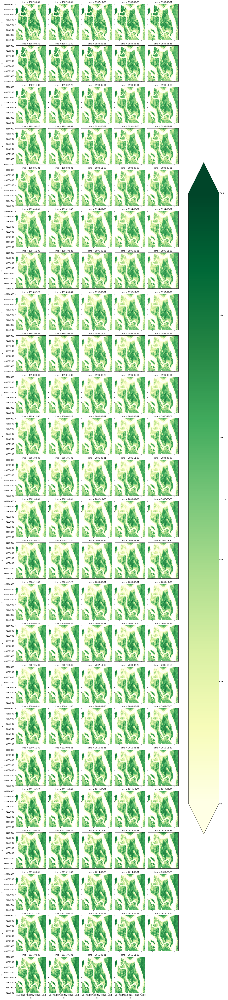

In [11]:
fcDrillMBay['PG']=(('time', 'y', 'x'),np.apply_along_axis(edgeSmoothSpline,0,fcDrillMBay.PV.data,fcDrillMBay.PV.time))
aspect=fcDrillMBay.PG.shape[2]/fcDrillMBay.PG.shape[1]
fcDrillMBay.PG.plot.imshow(col='time', col_wrap=5, cmap='YlGn',vmin=0, vmax=100,aspect=aspect)


### Apply to Mitchell Grasslands

In [15]:
mgdquery = {
    'time': ('1980-01-01', '2017-01-01'),
     'lat': (-20.45329,-20.43362),
     'lon': (141.98298,142.02395),
}
mapQuery(mgdquery)

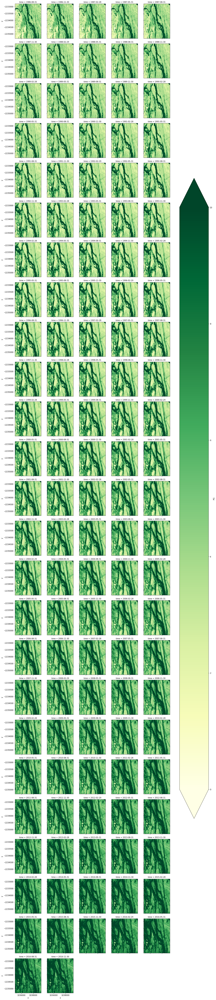

In [5]:
fcDrillMGD['PG']=(('time', 'y', 'x'),np.apply_along_axis(edgeSmoothSpline,0,fcDrillMGD.PV.data,fcDrillMGD.PV.time))
aspect=fcDrillMGD.PG.shape[2]/fcDrillMGD.PG.shape[1]
fcDrillMGD.PG.plot.imshow(col='time', col_wrap=5, cmap='YlGn',vmin=0, vmax=10, aspect=aspect)